# Kiểm tra dữ liệu UIT-MLReceipts Original

Notebook này chỉ đọc dữ liệu tại `dataset/UIT-MLReceipts/Original`, không thay đổi ảnh hoặc JSON. Các kiểm tra được thực hiện theo thứ tự:

1. Ảnh trùng byte giữa các split bằng SHA-256.
2. Bounding box có chiều rộng hoặc chiều cao không dương.
3. Kích thước ảnh trong JSON khác kích thước file thật.
4. Thống kê trường `text`, đặc biệt giá trị placeholder `"a"`.

> Kiểm tra SHA-256 phát hiện ảnh giống hệt byte. Nó không phát hiện mọi trường hợp ảnh bị resize, crop hoặc nén lại.

In [1]:
from pathlib import Path
from collections import Counter, defaultdict
import hashlib
import json

try:
    from PIL import Image, ImageDraw, ImageFont, ImageOps
except ImportError as exc:
    raise ImportError("Notebook cần Pillow. Cài bằng: pip install pillow") from exc

SPLITS = ("train", "val", "test")
DATASET_RELATIVE = Path("dataset/UIT-MLReceipts/Original")

def locate_dataset_root():
    start = Path.cwd().resolve()
    for base in (start, *start.parents):
        candidate = base / DATASET_RELATIVE
        required = [candidate / f"{split}.json" for split in SPLITS]
        required += [candidate / split for split in SPLITS]
        if all(path.exists() for path in required):
            return candidate
    raise FileNotFoundError(
        f"Không tìm thấy {DATASET_RELATIVE} từ {start} hoặc các thư mục cha."
    )

DATASET_ROOT = locate_dataset_root()
print("Dataset root:", DATASET_ROOT)

Dataset root: /home/ubuntu/Documents/HK1/Computer_Vision_and_Applications/project/dataset/UIT-MLReceipts/Original


In [2]:
def print_table(rows, columns=None, max_rows=None):
    if not rows:
        print("(không có kết quả)")
        return
    columns = columns or list(rows[0].keys())
    shown = rows if max_rows is None else rows[:max_rows]
    rendered = [[str(row.get(col, "")) for col in columns] for row in shown]
    widths = []
    for idx, col in enumerate(columns):
        widths.append(min(80, max(len(str(col)), *(len(r[idx]) for r in rendered))))
    def line(values):
        return " | ".join(value[:width].ljust(width) for value, width in zip(values, widths))
    print(line([str(c) for c in columns]))
    print("-+-".join("-" * width for width in widths))
    for values in rendered:
        print(line(values))
    if max_rows is not None and len(rows) > max_rows:
        print(f"... còn {len(rows) - max_rows} dòng")

datasets = {}
summary_rows = []
for split in SPLITS:
    json_path = DATASET_ROOT / f"{split}.json"
    with json_path.open(encoding="utf-8") as handle:
        data = json.load(handle)
    datasets[split] = data
    image_files = [p for p in (DATASET_ROOT / split).iterdir() if p.is_file()]
    summary_rows.append({
        "split": split,
        "files": len(image_files),
        "json_images": len(data.get("images", [])),
        "annotations": len(data.get("annotations", [])),
        "categories": len(data.get("categories", [])),
    })

print_table(summary_rows)

split | files | json_images | annotations | categories
------+-------+-------------+-------------+-----------
train | 1000  | 1000        | 6053        | 4         
val   | 358   | 358         | 2173        | 4         
test  | 789   | 789         | 4846        | 4         


### Hàm hỗ trợ trực quan hóa

Các ô bên dưới dùng chính ảnh gốc, vẽ bbox và nhãn lên ảnh rồi ghép thành bảng so sánh. Màu đỏ và dấu chữ thập được dành cho bbox lỗi.

In [3]:
try:
    from IPython.display import display as display_image
except ImportError:
    display_image = None

CATEGORY_COLORS = {
    "SELLER": "#00AEEF",
    "ADDRESS": "#8E44AD",
    "TIMESTAMP": "#F39C12",
    "TOTAL_COST": "#27AE60",
}

def load_font(size=22):
    candidates = [
        Path("/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf"),
        Path("/usr/share/fonts/truetype/liberation2/LiberationSans-Regular.ttf"),
    ]
    for path in candidates:
        if path.exists():
            return ImageFont.truetype(str(path), size=size)
    return ImageFont.load_default()

def show_contact_sheet(items, columns=2, cell_width=560, cell_height=700):
    """items: danh sách (PIL.Image, tiêu đề)."""
    if not items:
        print("Không có ảnh để hiển thị.")
        return None
    title_height = 72
    rows = (len(items) + columns - 1) // columns
    sheet = Image.new("RGB", (columns * cell_width, rows * cell_height), "white")
    draw = ImageDraw.Draw(sheet)
    font = load_font(19)
    for index, (image, title) in enumerate(items):
        row, column = divmod(index, columns)
        left, top = column * cell_width, row * cell_height
        preview = ImageOps.contain(image.convert("RGB"), (cell_width - 20, cell_height - title_height - 20))
        px = left + (cell_width - preview.width) // 2
        py = top + title_height + (cell_height - title_height - preview.height) // 2
        sheet.paste(preview, (px, py))
        draw.multiline_text((left + 10, top + 8), title, fill="black", font=font, spacing=3)
        draw.rectangle((left, top, left + cell_width - 1, top + cell_height - 1), outline="#BBBBBB", width=2)
    if display_image is not None:
        display_image(sheet)
    else:
        print("Contact sheet:", sheet.size)
    return sheet

def image_and_annotations(split, file_name):
    data = datasets[split]
    image_info = next(item for item in data["images"] if item["file_name"] == file_name)
    annotations = [item for item in data["annotations"] if item["image_id"] == image_info["id"]]
    categories = {item["id"]: item["name"] for item in data["categories"]}
    return image_info, annotations, categories

def draw_receipt_annotations(split, file_name, highlight_annotation_id=None):
    image_info, annotations, categories = image_and_annotations(split, file_name)
    image = Image.open(DATASET_ROOT / split / file_name).convert("RGB")
    draw = ImageDraw.Draw(image)
    line_width = max(3, min(image.size) // 250)
    font = load_font(max(18, min(image.size) // 55))
    for annotation in annotations:
        x, y, width, height = annotation["bbox"]
        category = categories.get(annotation.get("category_id"), str(annotation.get("category_id")))
        is_highlight = annotation.get("id") == highlight_annotation_id
        color = "#FF0000" if is_highlight else CATEGORY_COLORS.get(category, "#00AEEF")
        if width > 0 and height > 0:
            draw.rectangle((x, y, x + width, y + height), outline=color, width=line_width * (2 if is_highlight else 1))
        if is_highlight and (width <= 0 or height <= 0):
            radius = max(20, min(image.size) // 35)
            draw.line((x - radius, y - radius, x + radius, y + radius), fill=color, width=line_width * 2)
            draw.line((x - radius, y + radius, x + radius, y - radius), fill=color, width=line_width * 2)
            draw.ellipse((x - radius, y - radius, x + radius, y + radius), outline=color, width=line_width)
        text = annotation.get("text")
        prefix = "LỖI: " if is_highlight else ""
        label = f"{prefix}{category} | text={text!r} | bbox={annotation['bbox']}"
        label_y = max(0, int(y) - font.size - 8)
        draw.text((max(0, int(x)), label_y), label, fill=color, font=font, stroke_width=2, stroke_fill="white")
    return image


## 1. Kiểm tra ảnh trùng giữa các split

Mỗi file được băm bằng SHA-256. Một nhóm chỉ được báo cáo nếu cùng hash xuất hiện ở ít nhất hai split khác nhau.

In [4]:
def sha256_file(path, chunk_size=1024 * 1024):
    digest = hashlib.sha256()
    with path.open("rb") as handle:
        for chunk in iter(lambda: handle.read(chunk_size), b""):
            digest.update(chunk)
    return digest.hexdigest()

hash_groups = defaultdict(list)
missing_image_files = []
for split in SPLITS:
    for image_info in datasets[split]["images"]:
        path = DATASET_ROOT / split / image_info["file_name"]
        if not path.exists():
            missing_image_files.append(str(path))
            continue
        hash_groups[sha256_file(path)].append({
            "split": split,
            "file_name": image_info["file_name"],
            "path": str(path),
        })

duplicate_groups = [
    (digest, items)
    for digest, items in hash_groups.items()
    if len({item["split"] for item in items}) > 1
]
duplicate_groups.sort(key=lambda pair: pair[0])
duplicate_rows = []
for group_id, (digest, items) in enumerate(duplicate_groups, start=1):
    for item in sorted(items, key=lambda x: (x["split"], x["file_name"])):
        duplicate_rows.append({
            "group": group_id,
            "sha256": digest,
            "split": item["split"],
            "file_name": item["file_name"],
        })

print("Số nhóm ảnh trùng byte giữa các split:", len(duplicate_groups))
print("Số file thuộc các nhóm trùng:", len(duplicate_rows))
print("Số file được JSON tham chiếu nhưng bị thiếu:", len(missing_image_files))
print_table(duplicate_rows, ["group", "split", "file_name", "sha256"])

Số nhóm ảnh trùng byte giữa các split: 5
Số file thuộc các nhóm trùng: 10
Số file được JSON tham chiếu nhưng bị thiếu: 0
group | split | file_name  | sha256                                                          
------+-------+------------+-----------------------------------------------------------------
1     | train | 000819.jpg | 7c65d5beb9e4de99bb4683d861d6ebe6c982fee9a9e0f581a768c283d58354d1
1     | val   | 000985.jpg | 7c65d5beb9e4de99bb4683d861d6ebe6c982fee9a9e0f581a768c283d58354d1
2     | train | 000304.jpg | 90c12dd09a359f99de2f88f189edf3002173fbccfe6322241ec17652e7a41dff
2     | val   | 001032.jpg | 90c12dd09a359f99de2f88f189edf3002173fbccfe6322241ec17652e7a41dff
3     | train | 000701.jpg | 988701c4485bf697c77f9b9ddb354ab2cf1e109e054fa473f3039da0e721c0d0
3     | val   | 001337.jpg | 988701c4485bf697c77f9b9ddb354ab2cf1e109e054fa473f3039da0e721c0d0
4     | test  | 001392.jpg | c513f546fc24b35fe536ec808f5415f711b4f04f29499d226fd6b80e2088388d
4     | train | 000075.jpg | c513

### Xem trực tiếp các cặp ảnh trùng

Hai ảnh trong cùng một nhóm có SHA-256 giống hệt nhau. Chúng được đặt cạnh nhau để xác nhận bằng mắt dù tên file và split khác nhau.

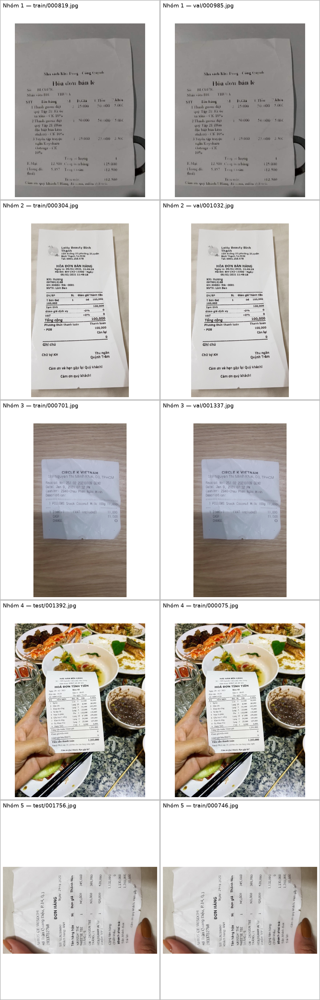

In [5]:
duplicate_visuals = []
for group_id, (_, items) in enumerate(duplicate_groups, start=1):
    for item in sorted(items, key=lambda value: (value["split"], value["file_name"])):
        with Image.open(item["path"]) as image:
            duplicate_visuals.append((
                image.convert("RGB").copy(),
                f"Nhóm {group_id} — {item['split']}/{item['file_name']}",
            ))

duplicate_contact_sheet = show_contact_sheet(duplicate_visuals, columns=2)

## 2. Kiểm tra bounding box có chiều rộng hoặc chiều cao bằng 0

COCO bbox có dạng `[x, y, width, height]`. Notebook báo cáo mọi bbox có `width <= 0` hoặc `height <= 0`, không chỉ đúng bằng 0.

In [6]:
invalid_bbox_rows = []
for split in SPLITS:
    data = datasets[split]
    image_by_id = {item["id"]: item for item in data["images"]}
    category_by_id = {item["id"]: item["name"] for item in data["categories"]}
    for annotation in data["annotations"]:
        x, y, width, height = annotation["bbox"]
        if width <= 0 or height <= 0:
            image_info = image_by_id.get(annotation["image_id"], {})
            invalid_bbox_rows.append({
                "split": split,
                "annotation_id": annotation.get("id"),
                "image_id": annotation.get("image_id"),
                "file_name": image_info.get("file_name", "<missing image id>"),
                "category": category_by_id.get(annotation.get("category_id"), annotation.get("category_id")),
                "bbox": annotation.get("bbox"),
                "text": annotation.get("text"),
            })

print("Số bounding box không hợp lệ:", len(invalid_bbox_rows))
print_table(invalid_bbox_rows)

Số bounding box không hợp lệ: 4
split | annotation_id | image_id | file_name  | category   | bbox              | text
------+---------------+----------+------------+------------+-------------------+-----
train | 5873          | 970      | 000990.jpg | TIMESTAMP  | [146, 1501, 0, 1] | a   
val   | 1226          | 206      | 001212.jpg | SELLER     | [60, 1691, 0, 1]  | a   
val   | 1668          | 279      | 001286.jpg | TOTAL_COST | [302, 1356, 0, 1] | a   
test  | 2406          | 403      | 001759.jpg | TIMESTAMP  | [345, 1484, 0, 0] | a   


### Xem vị trí của 4 bbox lỗi

BBox có chiều rộng hoặc chiều cao bằng 0 không tạo thành hình chữ nhật nhìn thấy được. Vì vậy notebook đánh dấu tọa độ `(x, y)` bằng vòng tròn và dấu chữ thập đỏ, đồng thời in nhãn, `text` và bbox ngay trên ảnh.

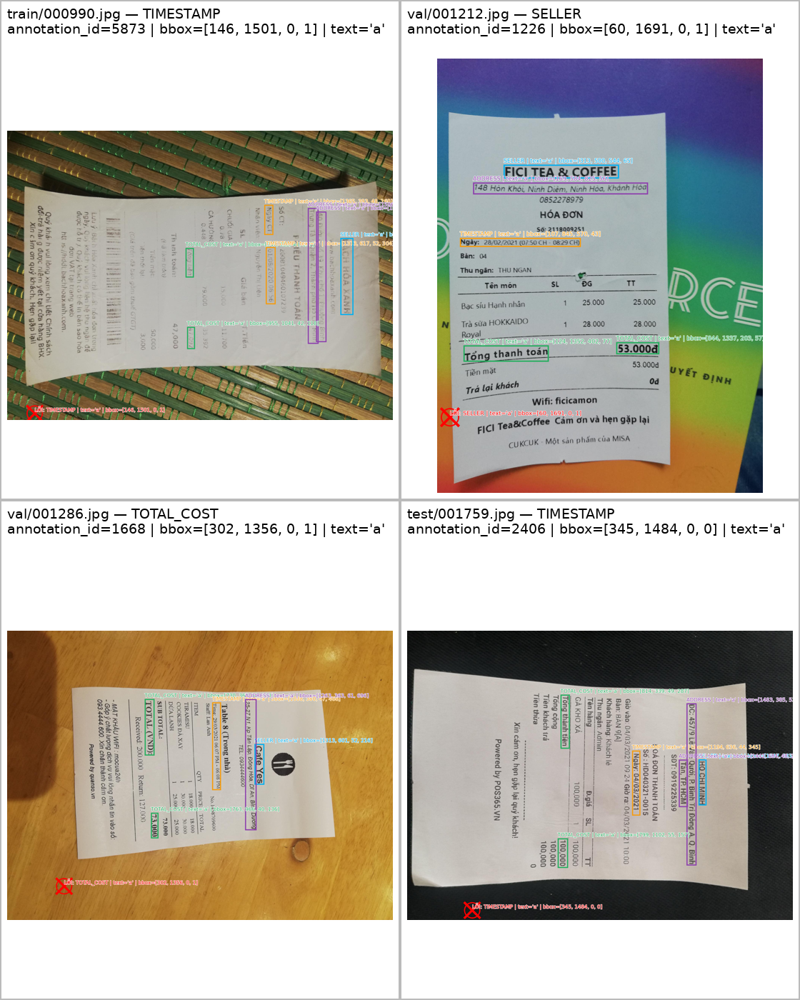

In [7]:
invalid_bbox_visuals = []
for row in invalid_bbox_rows:
    annotated_image = draw_receipt_annotations(
        row["split"],
        row["file_name"],
        highlight_annotation_id=row["annotation_id"],
    )
    title = (
        f"{row['split']}/{row['file_name']} — {row['category']}\n"
        f"annotation_id={row['annotation_id']} | bbox={row['bbox']} | text={row['text']!r}"
    )
    invalid_bbox_visuals.append((annotated_image, title))

invalid_bbox_contact_sheet = show_contact_sheet(invalid_bbox_visuals, columns=2)

## 3. So sánh kích thước JSON với kích thước file ảnh thật

Kích thước trong JSON được so với `PIL.Image.size`. `delta_width` và `delta_height` được tính bằng kích thước thật trừ kích thước trong JSON.

In [8]:
dimension_mismatch_rows = []
unreadable_image_rows = []
for split in SPLITS:
    for image_info in datasets[split]["images"]:
        path = DATASET_ROOT / split / image_info["file_name"]
        try:
            with Image.open(path) as image:
                actual_width, actual_height = image.size
        except Exception as exc:
            unreadable_image_rows.append({
                "split": split,
                "file_name": image_info["file_name"],
                "error": repr(exc),
            })
            continue
        json_width = image_info["width"]
        json_height = image_info["height"]
        if (actual_width, actual_height) != (json_width, json_height):
            dimension_mismatch_rows.append({
                "split": split,
                "image_id": image_info["id"],
                "file_name": image_info["file_name"],
                "json_size": (json_width, json_height),
                "actual_size": (actual_width, actual_height),
                "delta_width": actual_width - json_width,
                "delta_height": actual_height - json_height,
            })

print("Số ảnh lệch kích thước:", len(dimension_mismatch_rows))
print("Số ảnh không đọc được:", len(unreadable_image_rows))
print_table(dimension_mismatch_rows)

Số ảnh lệch kích thước: 10
Số ảnh không đọc được: 0
split | image_id | file_name  | json_size    | actual_size  | delta_width | delta_height
------+----------+------------+--------------+--------------+-------------+-------------
train | 213      | 000214.jpg | (1014, 2048) | (1012, 2048) | -2          | 0           
train | 881      | 000882.jpg | (1534, 2048) | (1532, 2048) | -2          | 0           
train | 925      | 000926.jpg | (2048, 1540) | (2048, 1538) | 0           | -2          
train | 931      | 000932.jpg | (2048, 1540) | (2048, 1538) | 0           | -2          
train | 954      | 000956.jpg | (1534, 2048) | (1532, 2048) | -2          | 0           
test  | 129      | 001481.jpg | (1534, 2048) | (1532, 2048) | -2          | 0           
test  | 162      | 001514.jpg | (1128, 2048) | (1126, 2048) | -2          | 0           
test  | 552      | 001911.jpg | (1154, 2048) | (1152, 2048) | -2          | 0           
test  | 592      | 001951.jpg | (952, 2048)  | (950, 2048)

### Xem 10 ảnh có kích thước lệch

Viền đỏ biểu diễn biên thật của file ảnh. Vì sai lệch chỉ 2 pixel nên gần như không thể thấy bằng mắt ở ảnh thu nhỏ; phần tiêu đề phía trên mỗi ảnh là bằng chứng định lượng cần dùng để nhận diện lỗi.

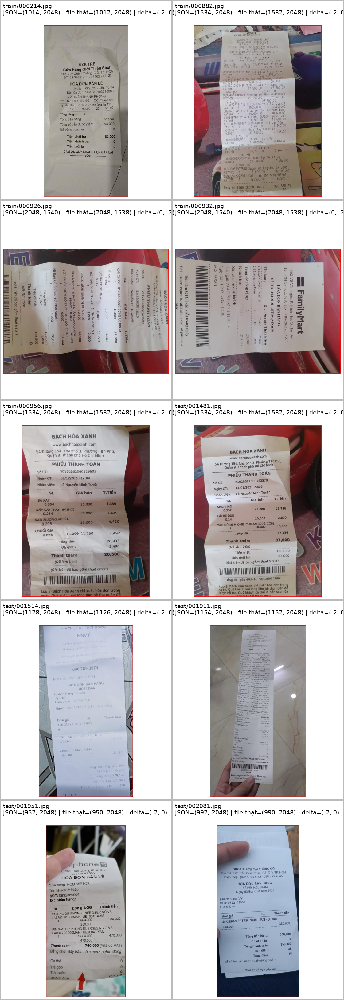

In [9]:
dimension_visuals = []
for row in dimension_mismatch_rows:
    path = DATASET_ROOT / row["split"] / row["file_name"]
    with Image.open(path) as source:
        image = source.convert("RGB").copy()
    draw = ImageDraw.Draw(image)
    border_width = max(4, min(image.size) // 200)
    draw.rectangle((0, 0, image.width - 1, image.height - 1), outline="#FF0000", width=border_width)
    title = (
        f"{row['split']}/{row['file_name']}\n"
        f"JSON={row['json_size']} | file thật={row['actual_size']} | delta=({row['delta_width']}, {row['delta_height']})"
    )
    dimension_visuals.append((image, title))

dimension_contact_sheet = show_contact_sheet(dimension_visuals, columns=2, cell_height=650)

## 4. Kiểm tra trường text và placeholder a

Một annotation được xem là placeholder khi `text == "a"`. Một ảnh là `all_placeholder` nếu tất cả annotation của ảnh đó đều có `text == "a"`.

In [10]:
text_summary_rows = []
placeholder_image_files = {}
real_text_image_files = {}
for split in SPLITS:
    data = datasets[split]
    image_by_id = {item["id"]: item for item in data["images"]}
    annotations_by_image = defaultdict(list)
    for annotation in data["annotations"]:
        annotations_by_image[annotation["image_id"]].append(annotation.get("text"))

    total_annotations = len(data["annotations"])
    placeholder_annotations = sum(
        annotation.get("text") == "a" for annotation in data["annotations"]
    )
    empty_annotations = sum(
        annotation.get("text") in (None, "") for annotation in data["annotations"]
    )

    all_placeholder = []
    any_real_text = []
    for image_id, image_info in image_by_id.items():
        texts = annotations_by_image.get(image_id, [])
        if texts and all(text == "a" for text in texts):
            all_placeholder.append(image_info["file_name"])
        if any(text not in (None, "", "a") for text in texts):
            any_real_text.append(image_info["file_name"])

    placeholder_image_files[split] = sorted(all_placeholder)
    real_text_image_files[split] = sorted(any_real_text)
    text_summary_rows.append({
        "split": split,
        "images": len(data["images"]),
        "annotations": total_annotations,
        "text_a_annotations": placeholder_annotations,
        "text_a_percent": f"{100 * placeholder_annotations / total_annotations:.1f}%",
        "all_placeholder_images": len(all_placeholder),
        "images_with_real_text": len(any_real_text),
        "empty_text_annotations": empty_annotations,
    })

print_table(text_summary_rows)
print("\nVí dụ ảnh train có transcript thật:", real_text_image_files["train"][:10])
print("Ví dụ ảnh train chỉ có placeholder:", placeholder_image_files["train"][:10])

split | images | annotations | text_a_annotations | text_a_percent | all_placeholder_images | images_with_real_text | empty_text_annotations
------+--------+-------------+--------------------+----------------+------------------------+-----------------------+-----------------------
train | 1000   | 6053        | 4552               | 75.2%          | 750                    | 250                   | 0                     
val   | 358    | 2173        | 2173               | 100.0%         | 358                    | 0                     | 0                     
test  | 789    | 4846        | 4846               | 100.0%         | 789                    | 0                     | 0                     

Ví dụ ảnh train có transcript thật: ['000001.jpg', '0000010.jpg', '000002.jpg', '000003.jpg', '000004.jpg', '000005.jpg', '000006.jpg', '000007.jpg', '000008.jpg', '000009.jpg']
Ví dụ ảnh train chỉ có placeholder: ['0001000.jpg', '000251.jpg', '000252.jpg', '000253.jpg', '000254.jpg', '000255.

### So sánh transcript thật với placeholder `a`

Mỗi ảnh dưới đây hiển thị toàn bộ bbox cùng `CATEGORY | text=...`. Ảnh train đầu tiên cho thấy transcript thật; ba ảnh còn lại cho thấy `text='a'` được lặp lại ở mọi vùng. Đây là dấu hiệu placeholder chứ không phải nội dung thực tế trên hóa đơn.

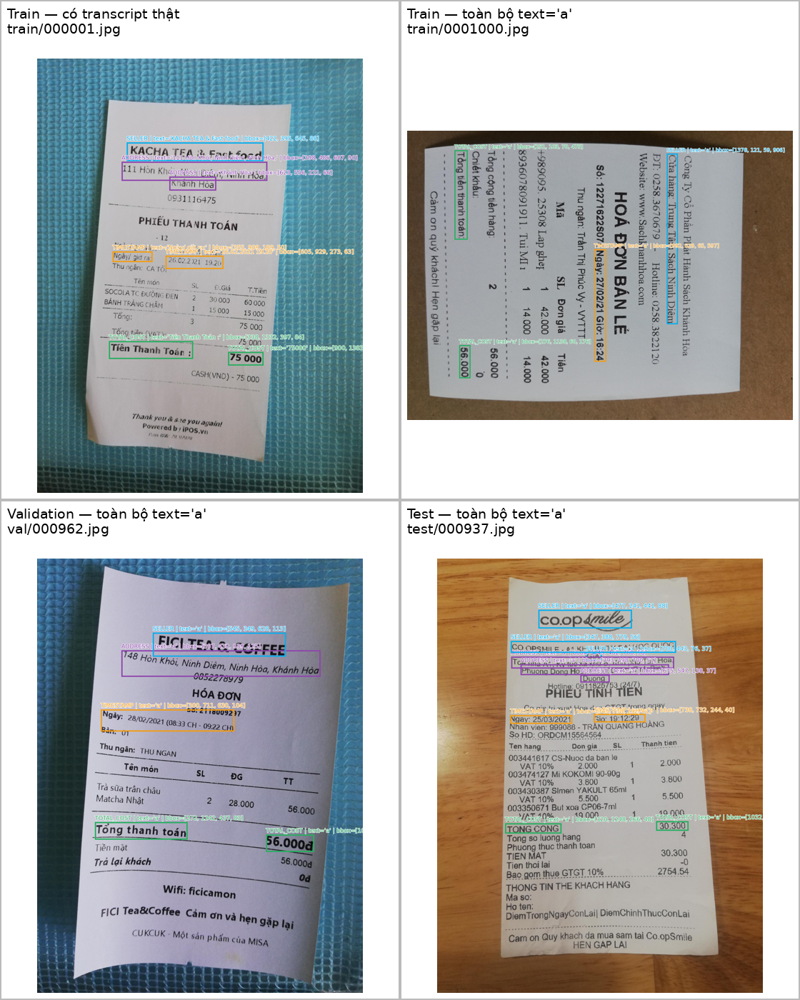

In [11]:
text_examples = []
example_specs = [
    ("train", real_text_image_files["train"][0], "Train — có transcript thật"),
    ("train", placeholder_image_files["train"][0], "Train — toàn bộ text='a'"),
    ("val", placeholder_image_files["val"][0], "Validation — toàn bộ text='a'"),
    ("test", placeholder_image_files["test"][0], "Test — toàn bộ text='a'"),
]
for split, file_name, description in example_specs:
    image = draw_receipt_annotations(split, file_name)
    text_examples.append((image, f"{description}\n{split}/{file_name}"))

text_contact_sheet = show_contact_sheet(text_examples, columns=2)